In [1]:
using Plots, LinearAlgebra, DifferentialEquations, MAT, PlotThemes

In [14]:
plotlyjs()
# theme(:ggplot2)

WebIO._IJuliaInit()

Plots.PlotlyJSBackend()

In [9]:
include("C:/Users/mjski/Desktop/Active-Work/git-projects/scripts/scripts/spacecraft_adcs.jl")
include("C:/Users/mjski/Desktop/Active-Work/git-projects/scripts/scripts/orbital_dynamics.jl")
include("C:/Users/mjski/Desktop/Active-Work/git-projects/scripts/scripts/orbital_elements.jl")
include("C:/Users/mjski/Desktop/Active-Work/git-projects/scripts/scripts/gnc.jl")

get_lunar_ephemeris (generic function with 1 method)

# Testing

In [3]:
function diffeq_two_body_simple(initial_conditions, time_span, params; solver_args...)
    function differential_system!(du, u, p, t)
        x, y, z, vx, vy, vz = u
        μ, mass = p

        r = sqrt(x^2 + y^2 + z^2)

        du[1] = vx
        du[2] = vy
        du[3] = vz
        du[4] = -μ * x / r^3
        du[5] = -μ * y / r^3
        du[6] = -μ * z / r^3
    end

    problem = ODEProblem(differential_system!, initial_conditions, time_span, params)
    solution = solve(problem; solver_args...)

    return solution
end

diffeq_two_body_simple (generic function with 1 method)

In [4]:
function diffeq_spacecraft_orbit(r, v, ra, rp, mass; periods=1, re=6378, μ=398600, kwargs...)
    params = [μ, mass]
    init = [r[1], r[2], r[3], v[1], v[2], v[3]]

    a = (ra + rp)/2
    tspan = (0.0, (2*π / sqrt(μ)) * a^(3/2))
    sol = diffeq_two_body_simple(init, tspan, params; kwargs...)

    return sol
end

diffeq_spacecraft_orbit (generic function with 1 method)

In [7]:
alt = 250
re = 6378
μ = 398600

r = [re+alt, 0, 0]

# θ = deg2rad(10)
# v = [0, cos(θ)*sqrt(μ / (re+alt)), sin(θ)*sqrt(μ / (re+alt))]

v = [0, sqrt(μ / (re+alt)), 0]

sol = diffeq_spacecraft_orbit(r, v, norm(r), norm(r), 225.0, solver=Vern7(), reltol=1e-9, abstol=1e-9)
length(sol)

36

In [94]:
times = LinRange(0, (2*π / sqrt(398600)) * (re + alt)^(3/2), 1000)
orbit_interp = sol(times)

orbit_x = orbit_interp[1,1:end]
orbit_y = orbit_interp[2,1:end]
orbit_z = orbit_interp[3,1:end];

In [9]:
function circle(x, y, r)
    θ = LinRange(0, 2*π, 500)
    x .+ r*sin.(θ), y .+ r*cos.(θ)
end

circle (generic function with 1 method)

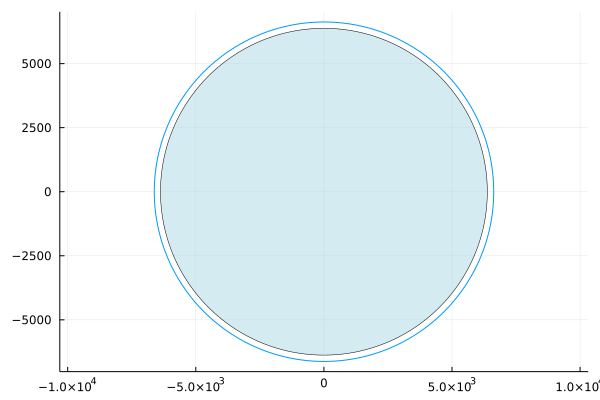

In [95]:
plot(orbit_x, orbit_y, dpi=230, aspect_ratio=:equal, label="")
plot!(circle(0, 0, 6378), seriestype = [:shape,], lw=0.5, c = :lightblue, fillalpha=0.5, label="")

In [75]:
function in_sun(r⃗_sat, r̂_sun)
    return !(dot(r⃗_sat, .-r̂_sun) < 0 && norm(r⃗_sat - dot(r⃗_sat, .-r̂_sun) .* (.-r̂_sun)) < 6378.0)
end

in_sun (generic function with 1 method)

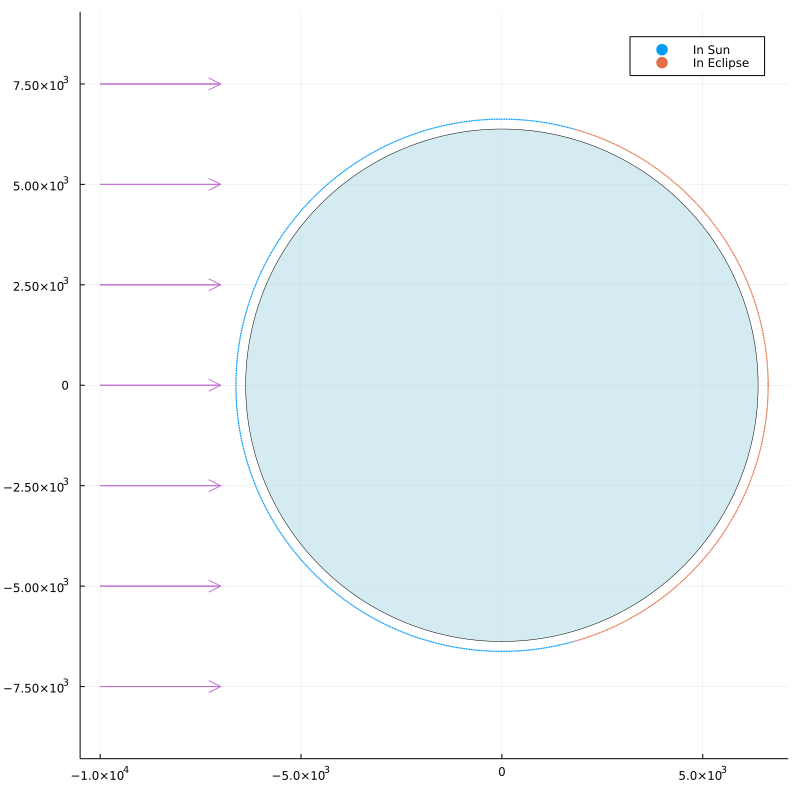

In [97]:
r_sun = [1, 0, 0]
r_sat = [[orbit_x[i], orbit_y[i], orbit_z[i]] for i in 1:length(orbit_x)]

sunvec = in_sun.(r_sat, [r_sun for i in 1:length(orbit_x)])

scatter(
    orbit_x[sunvec], orbit_y[sunvec], sunvec,
    dpi=300, 
    aspect_ratio=:equal, 
    label="In Sun", 
    markersize=1, 
    markerstrokewidth=0,
    size=(800,800)
)


scatter!(orbit_x[.!sunvec], orbit_y[.!sunvec], label="In Eclipse", markersize=1, markerstrokewidth=0)
plot!(circle(0, 0, 6378), seriestype = [:shape,], lw=0.5, c = :lightblue, fillalpha=0.5, label="")

ys = [7500, 5000, 2500, 0, -2500, -5000, -7500]
quiver!([-10000 for _ in 1:length(ys)], ys, quiver=([3000 for _ in 1:length(ys)], [0 for _ in 1:length(ys)]))

In [88]:
matwrite("orbit_data.mat", Dict(
    "time" => collect(times),
    "orbit_x" => orbit_x,
    "orbit_y" => orbit_y,
    "orbit_z" => orbit_z,
    "in_sun" => sunvec
))

# Complete Trajectory Analysis
- Initial inclination: 55 degrees 
- Initial RAAN: –45 degrees 
- on April 1st at 16:00:00.

In [10]:
re = 6378
μ = 398600

rp_init = re + 300
ra_init = re + 350

e_init = (ra_init - rp_init) / (ra_init + rp_init)
i_init = deg2rad(55)
Ω_init = deg2rad(-45)
ω_init = 0
θ_init = 0

h_init = sqrt(rp_init * μ * (1 + e_init * cos(θ_init)))

# e, i, asc, arg, theta = orbital_elements
r_init, v_init = geocentric_state_vector_transform(h_init, [e_init, i_init, Ω_init, ω_init, θ_init])

([4722.059084763765, -4722.059084763765, 0.0], [3.1392805192712436, 3.139280519271244, 6.340424580115555])

In [11]:
sol_traj1 = diffeq_spacecraft_orbit(r_init, v_init, ra_init, rp_init, 225.0, solver=Vern9(), reltol=1e-12, abstol=1e-12)

a_traj1 = (ra_init + rp_init) / 2
period_traj1 = (2*π / sqrt(μ)) * a_traj1^(3/2)

times_traj1 = LinRange(0, period_traj1/2, 1000)
orbit_interp_traj1 = sol_traj1(times_traj1)

orbit_x_traj1 = orbit_interp_traj1[1,1:end]
orbit_y_traj1 = orbit_interp_traj1[2,1:end]
orbit_z_traj1 = orbit_interp_traj1[3,1:end]

orbit_vx_traj1 = orbit_interp_traj1[4,1:end]
orbit_vy_traj1 = orbit_interp_traj1[5,1:end]
orbit_vz_traj1 = orbit_interp_traj1[6,1:end];

In [12]:
rp_traj2 = sqrt(orbit_x_traj1[end]^2 + orbit_y_traj1[end]^2 + orbit_z_traj1[end]^2)
ra_traj2 = re + 450

e_traj2 = (ra_traj2 - rp_traj2) / (ra_traj2 + rp_traj2)
i_traj2 = i_init
Ω_traj2 = Ω_init
ω_traj2 = ω_init + π
θ_traj2 = 0

h_traj2 = sqrt(rp_traj2 * μ * (1 + e_traj2 * cos(θ_traj2)))

# e, i, asc, arg, theta = orbital_elements
r_traj2, v_traj2 = geocentric_state_vector_transform(h_traj2, [e_traj2, i_traj2, Ω_traj2, ω_traj2, θ_traj2])

sol_traj2 = diffeq_spacecraft_orbit(r_traj2, v_traj2, ra_traj2, rp_traj2, 225.0, solver=Vern9(), reltol=1e-12, abstol=1e-12)

a_traj2 = (ra_traj2 + rp_traj2) / 2
period_traj2 = (2*π / sqrt(μ)) * a_traj2^(3/2)

times_traj2 = LinRange(0, period_traj2/2, 1000)
orbit_interp_traj2 = sol_traj2(times_traj2)

orbit_x_traj2 = orbit_interp_traj2[1,1:end]
orbit_y_traj2 = orbit_interp_traj2[2,1:end]
orbit_z_traj2 = orbit_interp_traj2[3,1:end]

orbit_vx_traj2 = orbit_interp_traj2[4,1:end]
orbit_vy_traj2 = orbit_interp_traj2[5,1:end]
orbit_vz_traj2 = orbit_interp_traj2[6,1:end];

In [13]:
rp_traj3 = re + 200
ra_traj3 = sqrt(orbit_x_traj2[end]^2 + orbit_y_traj2[end]^2 + orbit_z_traj2[end]^2)

e_traj3 = (ra_traj3 - rp_traj3) / (ra_traj3 + rp_traj3)
i_traj3 = i_init + deg2rad(10)
Ω_traj3 = Ω_init
ω_traj3 = ω_init + π
θ_traj3 = π

h_traj3 = sqrt(ra_traj3 * μ * (1 + e_traj3 * cos(θ_traj3)))

# e, i, asc, arg, theta = orbital_elements
r_traj3, v_traj3 = geocentric_state_vector_transform(h_traj3, [e_traj3, i_traj3, Ω_traj3, ω_traj3, θ_traj3])

sol_traj3 = diffeq_spacecraft_orbit(r_traj3, v_traj3, ra_traj3, rp_traj3, 225.0, solver=Vern9(), reltol=1e-12, abstol=1e-12)

a_traj3 = (ra_traj3 + rp_traj3) / 2
period_traj3 = (2*π / sqrt(μ)) * a_traj3^(3/2)

times_traj3 = LinRange(0, period_traj3/2, 1000)
orbit_interp_traj3 = sol_traj3(times_traj3)

orbit_x_traj3 = orbit_interp_traj3[1,1:end]
orbit_y_traj3 = orbit_interp_traj3[2,1:end]
orbit_z_traj3 = orbit_interp_traj3[3,1:end]

orbit_vx_traj3 = orbit_interp_traj3[4,1:end]
orbit_vy_traj3 = orbit_interp_traj3[5,1:end]
orbit_vz_traj3 = orbit_interp_traj3[6,1:end];

In [15]:
plot(times_traj1, sqrt.(orbit_x_traj1.^2 .+ orbit_y_traj1.^2 .+ orbit_z_traj1.^2) .- re)
plot!(times_traj2, sqrt.(orbit_x_traj2.^2 .+ orbit_y_traj2.^2 .+ orbit_z_traj2.^2) .- re)
plot!(times_traj3, sqrt.(orbit_x_traj3.^2 .+ orbit_y_traj3.^2 .+ orbit_z_traj3.^2) .- re)

In [17]:
plot(times_traj1, sqrt.(orbit_x_traj1.^2 .+ orbit_y_traj1.^2 .+ orbit_z_traj1.^2) .- re, label="Transfer Orbit 1", size=(900,500))
plot!(times_traj2 .+ times_traj1[end], sqrt.(orbit_x_traj2.^2 .+ orbit_y_traj2.^2 .+ orbit_z_traj2.^2) .- re, label="Transfer Orbit 2")
plot!(times_traj3 .+ times_traj1[end] .+ times_traj2[end], sqrt.(orbit_x_traj3.^2 .+ orbit_y_traj3.^2 .+ orbit_z_traj3.^2) .- re, label="Deorbit")

In [16]:
# total mission time
times_traj3[end] + times_traj1[end] + times_traj2[end]

8238.268626104293

In [18]:
# spherical: (radius r, inclination θ, azimuth φ)
X(r,theta,phi) = r * sin(theta) * sin(phi)
Y(r,theta,phi) = r * sin(theta) * cos(phi)
Z(r,theta,phi) = r * cos(theta)

thetas = range(0, stop=2*π, length=50)
phis   = range(0, stop=2*π, length=50)

xs = [X(re, theta, phi) for theta in thetas, phi in phis] 
ys = [Y(re, theta, phi) for theta in thetas, phi in phis]
zs = [Z(re, theta, phi) for theta in thetas, phi in phis]

plot(
    orbit_x_traj1, orbit_y_traj1, orbit_z_traj1, 
    dpi=230, 
    aspect_ratio=:equal, 
    label="Transfer Orbit 1",
    size=(900,800),
    template=:dark
)

plot!(orbit_x_traj2, orbit_y_traj2, orbit_z_traj2, label="Transfer Orbit 2")
plot!(orbit_x_traj3, orbit_y_traj3, orbit_z_traj3, label="Deorbit")

#surface!(xs, ys, zs, colorbar=nothing, color=:lightblue)

In [30]:
# getting results at fixed timesteps
traj1_time = times_traj1[end]
traj2_time = times_traj2[end]
traj3_time = times_traj3[end]
final_time = traj1_time + traj2_time + traj3_time
final_times = LinRange(0.0, final_time, 10000)

traj1_ind = length(final_times[final_times .<= traj1_time])
traj2_ind = length(final_times[final_times .<= traj2_time + traj1_time])
traj3_ind = length(final_times[final_times .<= traj3_time])

traj1_interp = sol_traj1(final_times[1:traj1_ind])
traj1_x = traj1_interp[1,1:end]
traj1_y = traj1_interp[2,1:end]
traj1_z = traj1_interp[3,1:end]
traj1_vx = traj1_interp[4,1:end]
traj1_vy = traj1_interp[5,1:end]
traj1_vz = traj1_interp[6,1:end]

traj2_interp = sol_traj2(final_times[1:traj2_ind-traj1_ind])
traj2_x = traj2_interp[1,1:end]
traj2_y = traj2_interp[2,1:end]
traj2_z = traj2_interp[3,1:end]
traj2_vx = traj2_interp[4,1:end]
traj2_vy = traj2_interp[5,1:end]
traj2_vz = traj2_interp[6,1:end]

traj3_interp = sol_traj3(final_times[1:traj3_ind])
traj3_x = traj3_interp[1,1:end]
traj3_y = traj3_interp[2,1:end]
traj3_z = traj3_interp[3,1:end]
traj3_vx = traj3_interp[4,1:end]
traj3_vy = traj3_interp[5,1:end]
traj3_vz = traj3_interp[6,1:end];

In [20]:
plot(
    traj1_x, traj1_y, traj1_z, 
    dpi=230, 
    aspect_ratio=:equal, 
    label="Transfer Orbit 1",
    size=(900,800),
    template=:dark
)

plot!(traj2_x, traj2_y, traj2_z, label="Transfer Orbit 2")
plot!(traj3_x, traj3_y, traj3_z, label="Deorbit")

In [29]:
length.([traj1_x, traj2_x, traj3_x]), length.([traj1_vx, traj2_vx, traj3_vx])

([3315, 3370, 3315], [3315, 3315, 3315])

In [31]:
total_x = vcat(traj1_x, traj2_x, traj3_x)
total_y = vcat(traj1_y, traj2_y, traj3_y)
total_z = vcat(traj1_z, traj2_z, traj3_z)

total_vx = vcat(traj1_vx, traj2_vx, traj3_vx)
total_vy = vcat(traj1_vy, traj2_vy, traj3_vy)
total_vz = vcat(traj1_vz, traj2_vz, traj3_vz)

plot(
    total_x, total_y, total_z, 
    dpi=230, 
    aspect_ratio=:equal, 
    label="Transfer Orbit 1",
    size=(900,800),
    template=:dark
)

In [22]:
plot(final_times, sqrt.(total_x.^2 .+ total_y.^2 .+ total_z.^2) .- re, label="")

# Thermal Analysis

In [86]:
# April 1st at 16:00:00.
r_earth, v_earth = get_planet_ephemeris(DateTime(2022,4,1,16,0,0))

r_unit_sun = r_earth ./ norm(r_earth)

r_baseline = [[total_x[i], total_y[i], total_z[i]] for i in 1:length(total_x)]
baseline_insun = in_sun.(r_baseline, [r_unit_sun for _ in 1:length(total_x)]);

In [109]:
r_unit_sun

3-element Vector{Float64}:
 -0.979571766223755
 -0.20109488982562526
  1.0163296012711764e-5

In [108]:
scatter(
    total_x[baseline_insun], total_y[baseline_insun], total_z[baseline_insun],
    dpi=300,
    aspect_ratio=:equal, 
    label="In Sun", 
    markersize=1, 
    markerstrokewidth=0,
    size=(800,800)
)


scatter!(total_x[.!baseline_insun], total_y[.!baseline_insun], total_z[.!baseline_insun], label="In Eclipse", markersize=1, markerstrokewidth=0)

surface!(xs, ys, zs, colorbar=nothing, color=:lightblue)

plot!([-9000*r_unit_sun[1], 9000*r_unit_sun[1]], [-9000*r_unit_sun[2], 9000*r_unit_sun[2]], [-9000*r_unit_sun[3], 9000*r_unit_sun[3]], label="")

In [32]:
stages = vcat(
    ["Transfer Orbit 1" for _ in 1:length(traj1_x)],
    ["Transfer Orbit 2" for _ in 1:length(traj2_x)],
    ["Deorbit" for _ in 1:length(traj3_x)]
)

matwrite("baseline_mission_data2.mat", Dict(
    "time" => collect(final_times),
    "stage" => stages,
    "orbit_x" => total_x,
    "orbit_y" => total_y,
    "orbit_z" => total_z,
    "orbit_vx" => total_vx,
    "orbit_vy" => total_vy,
    "orbit_vz" => total_vz
))

In [33]:
length(total_vx)

10000